In [109]:
import cadquery as cq
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import math
import os
import ezdxf
from IPython.display import display
import ipywidgets as widgets

from IPython.display import HTML
from matplotlib.animation import FuncAnimation
import matplotlib.patches as patches

from IPython.display import Image
import matplotlib as mpl

mpl.rcParams["animation.embed_limit"] = 30  # Set to custom instead of default ~20MB

In [110]:
GANTRY_GAP = 924

In [111]:
def load_step_file(filename):
    model = cq.importers.importStep(filename)

    # Clear previous data

    # Extract all faces
    all_faces = model.faces().vals()
    print(f"Found {len(all_faces)} faces in the STEP file")

    faces = []
    face_centers = []

    # Store faces and calculate centers
    for face in all_faces:
        faces.append(face)
        center = face.Center()
        face_centers.append((center.x, center.y, center.z))

    return faces, face_centers

In [112]:
# faces, face_centers = load_step_file("x1_wing_cutting.step")
# faces, face_centers = load_step_file("h_tail_leading_edge.step")
faces, face_centers = load_step_file("vtail_leading_edge.step")

Found 8 faces in the STEP file


In [113]:
def visualize_faces(faces, face_centers):
    """Visualize faces with ID numbers in a 3D plot"""
    if not faces:
        print("No faces loaded. Please load a STEP file first.")
        return

    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')
    face_plots = []

    # Plot each face with a unique color and ID
    for i, face in enumerate(faces):
        # Create a color for this face
        color = plt.cm.tab20(i % 20)
        
        # Get face bounds to create a simplified visualization
        bounds = face.BoundingBox()
        
        # Tesselate the face to get 3D points
        try:
            mesh = face.tessellate(0.1, 0.1)
            vertices = mesh[0]
            triangles = mesh[1]
            
            # If the face is too complex, simplify visualization
            if len(triangles) > 500:
                # Subsample to a manageable number of triangles
                sample_size = min(500, len(triangles))
                indices = np.random.choice(len(triangles), sample_size, replace=False)
                triangles = [triangles[i] for i in indices]
                
            # Plot the face as a collection of triangles
            for triangle in triangles:
                points = [vertices[idx] for idx in triangle]
                xs = [p.x for p in points]
                ys = [p.y for p in points]
                zs = [p.z for p in points]
                
                # Add the first point again to close the triangle
                xs.append(xs[0])
                ys.append(ys[0])
                zs.append(zs[0])
                
                # Plot the triangle
                face_plot = ax.plot(xs, ys, zs, color=color, alpha=0.5)[0]
                face_plots.append(face_plot)
        except:
            # Fallback visualization if tessellation fails
            x_range = np.linspace(bounds.xmin, bounds.xmax, 2)
            y_range = np.linspace(bounds.ymin, bounds.ymax, 2)
            X, Y = np.meshgrid(x_range, y_range)
            Z = np.ones_like(X) * (bounds.zmin + bounds.zmax) / 2
            
            face_plot = ax.plot_surface(X, Y, Z, color=color, alpha=0.5)
            face_plots.append(face_plot)
        
        # Add face ID at center
        center = face_centers[i]
        ax.text(center[0], center[1], center[2], f"{i}", 
                fontsize=12, ha='center', va='center', 
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title('STEP File Faces with IDs')

    plt.tight_layout()
    plt.show()

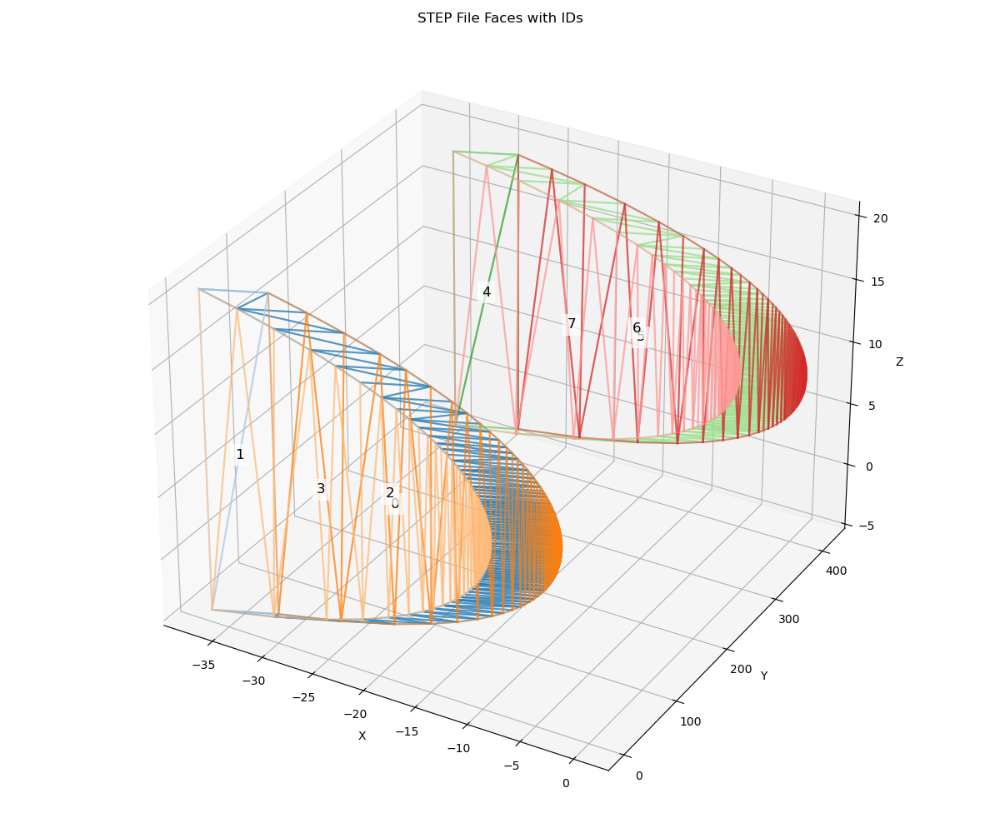

In [114]:
visualize_faces(faces, face_centers)

In [115]:
# selected_faces = [7, 8, 12, 13]
# selected_faces = [2, 7]
selected_faces = [7, 3]

In [116]:
def extract_face_edges(face):
    """Extract the edges from a face with geometry-aware sampling"""
    edges = []
    points_flat = []

    # Get all the edges of the face
    for edge in face.Edges():
        points = []

        try:
            # Determine edge type
            edge_type = edge.geomType()

            if edge_type == "LINE":
                # For lines, we only need start and end points
                start_point = edge.startPoint()
                end_point = edge.endPoint()
                points.append((start_point.x, start_point.y, start_point.z))
                points.append((end_point.x, end_point.y, end_point.z))

            elif edge_type == "ARC":
                # For arcs, sample based on arc angle and radius
                try:
                    # Use CadQuery's specific methods for arcs
                    radius = edge.radius()
                    start_point = edge.startPoint()
                    end_point = edge.endPoint()
                    
                    # Calculate the arc length (approximate using start and end points)
                    arc_length = radius * edge.arcAngle() * (np.pi / 180)
                    
                    # Sample the arc - 1 point per degree of arc with a minimum of 10
                    num_points = max(10, int(abs(edge.arcAngle())))
                    
                    # Sample the arc
                    for i in range(num_points):
                        t = i / (num_points - 1)
                        try:
                            point = edge.positionAt(t)
                            points.append((point.x, point.y, point.z))
                        except:
                            continue
                except Exception as e:
                    print(f"Error processing arc: {str(e)}")
                    # Fallback to uniform sampling
                    num_points = 20
                    for i in range(num_points):
                        t = i / (num_points - 1)
                        try:
                            point = edge.positionAt(t)
                            points.append((point.x, point.y, point.z))
                        except:
                            continue

            elif edge_type == "CIRCLE":
                # For circles, sample based on radius
                radius = edge.radius()
                # Calculate points based on circumference
                circumference = 2 * np.pi * radius
                # Use approximately 1 point per mm for circles
                num_points = max(20, int(circumference / 1.0))
                
                for i in range(num_points):
                    t = i / (num_points - 1)
                    try:
                        point = edge.positionAt(t)
                        points.append((point.x, point.y, point.z))
                    except:
                        continue
                        
            elif edge_type == "ELLIPSE":
                # For ellipses, sample more densely
                try:
                    # Get approximate size using BoundingBox() method
                    bbox = edge.BoundingBox()
                    size = max(bbox.xlen, bbox.ylen)
                    num_points = max(30, int(size * 2))
                    
                    for i in range(num_points):
                        t = i / (num_points - 1)
                        try:
                            point = edge.positionAt(t)
                            points.append((point.x, point.y, point.z))
                        except:
                            continue
                except:
                    # Fallback if BoundingBox not available
                    num_points = 40
                    for i in range(num_points):
                        t = i / (num_points - 1)
                        try:
                            point = edge.positionAt(t)
                            points.append((point.x, point.y, point.z))
                        except:
                            continue
                        
            elif edge_type == "BSPLINE":
                # For B-splines in CadQuery, we'll use a different approach
                
                # Approach 1: Use length-based sampling
                try:
                    # Calculate points based on edge length
                    edge_length = edge.Length()
                    
                    # Use more points for longer edges
                    base_density = 1.0  # points per unit length
                    num_points = max(20, int(edge_length * base_density))
                    num_points = min(num_points, 200)  # Cap at 200 points
                    
                except Exception:
                    # If Length() method fails, use a fixed number of points
                    num_points = 50
                
                # Initial uniform sampling
                sample_points = []
                for i in range(num_points):
                    t = i / (num_points - 1)
                    try:
                        point = edge.positionAt(t)
                        sample_points.append((point.x, point.y, point.z))
                    except:
                        continue
                
                # Check if we need adaptive sampling based on curvature
                if len(sample_points) >= 3:
                    # Calculate curvature estimation and add extra points where needed
                    refined_points = [sample_points[0]]  # Start with first point
                    
                    for i in range(1, len(sample_points) - 1):
                        prev_point = sample_points[i-1]
                        curr_point = sample_points[i]
                        next_point = sample_points[i+1]
                        
                        # Add current point
                        refined_points.append(curr_point)
                        
                        # Calculate vectors and estimate curvature
                        v1 = [curr_point[j] - prev_point[j] for j in range(3)]
                        v2 = [next_point[j] - curr_point[j] for j in range(3)]
                        
                        # Calculate lengths
                        len_v1 = sum(v**2 for v in v1)**0.5
                        len_v2 = sum(v**2 for v in v2)**0.5
                        
                        if len_v1 > 1e-6 and len_v2 > 1e-6:
                            # Normalize vectors
                            v1_norm = [v/len_v1 for v in v1]
                            v2_norm = [v/len_v2 for v in v2]
                            
                            # Calculate dot product
                            dot_product = sum(v1_norm[j] * v2_norm[j] for j in range(3))
                            
                            # Estimate curvature (1-dot gives a measure of the angle)
                            curvature = 1 - max(-1, min(1, dot_product))  # Clamp to [-1, 1]
                            
                            # Add extra points where curvature is high
                            if curvature > 0.1:  # Threshold for adding points
                                # Add more points between curr and next
                                extra_points = int(curvature * 10) + 1  # More points for higher curvature
                                
                                for j in range(1, extra_points):
                                    t_extra = i + j/(extra_points + 1)
                                    t_normalized = t_extra / (num_points - 1)
                                    try:
                                        point = edge.positionAt(t_normalized)
                                        refined_points.append((point.x, point.y, point.z))
                                    except:
                                        continue
                    
                    # Add last point
                    refined_points.append(sample_points[-1])
                    points = refined_points
                else:
                    # If adaptive sampling failed, use the uniform sampling
                    points = sample_points
                    
            else:
                # For other curve types (or types we didn't explicitly handle)
                # Use default uniform sampling
                num_points = 40
                for i in range(num_points):
                    t = i / (num_points - 1)
                    try:
                        point = edge.positionAt(t)
                        points.append((point.x, point.y, point.z))
                    except:
                        continue

        except Exception as e:
            print(f"Error extracting edge of type {edge.geomType()}: {str(e)}")
            # Fallback to basic sampling
            num_points = 30
            for i in range(num_points):
                t = i / (num_points - 1)
                try:
                    point = edge.positionAt(t)
                    points.append((point.x, point.y, point.z))
                except:
                    continue

        # Add the edge points if we have any
        if points:
            edges.append(points)
            points_flat.extend(points)

    return edges

In [117]:
entities = []

for face_id in selected_faces:
    face = faces[face_id]
    edges = extract_face_edges(face)
    entities.extend(edges)

In [118]:
def visualize_entities_3d(entities, title="3D Entities Visualization"):
    """
    Create a 3D visualization of the extracted entities, connecting points properly.
    
    Args:
        entities: List of point sets representing edges/curves
        title: Title for the visualization
    """
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    # Define a colormap for different entities
    colors = plt.cm.tab20(np.linspace(0, 1, len(entities)))
    
    # Check if there are any entities
    if not entities or all(len(entity) == 0 for entity in entities):
        ax.text(0, 0, 0, "No entities to display", 
                fontsize=14, ha='center', va='center')
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
        ax.set_title(title)
        plt.tight_layout()
        plt.show()
        return
    
    # Plot each entity with connected points
    for i, entity in enumerate(entities):
        # Get points from the entity
        if not entity:  # Skip empty entities
            continue
            
        # Extract x, y, z coordinates
        xs = [point[0] for point in entity]
        ys = [point[1] for point in entity]
        zs = [point[2] for point in entity]
        
        # Plot the connected line
        ax.plot(xs, ys, zs, '-', linewidth=2, color=colors[i], 
                label=f"Entity {i}")
        
        # Add markers for start and end points to distinguish direction
        ax.scatter(xs[0], ys[0], zs[0], color=colors[i], marker='o', s=50, 
                  label="_nolegend_")  # Start point
        ax.scatter(xs[-1], ys[-1], zs[-1], color=colors[i], marker='x', s=50,
                  label="_nolegend_")  # End point
        
        # Add entity ID at the midpoint of the entity
        if len(xs) > 2:
            # Find the midpoint index (approximately)
            mid_idx = len(xs) // 2
            
            # Draw the entity ID text
            ax.text(xs[mid_idx], ys[mid_idx], zs[mid_idx], f"{i}", 
                    fontsize=10, ha='center', va='center', 
                    bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'),
                    zorder=10)  # Higher zorder to ensure text is on top
        elif len(xs) == 2:
            #Draw the entity ID text in the middle
            ax.text((xs[0] + xs[1]) / 2, (ys[0] + ys[1]) / 2, (zs[0] + zs[1]) / 2, f"{i}",
                    fontsize=10, ha='center', va='center',
                    bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'),
                    zorder=10)
    
    # Set labels and title
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title(title)
    
    # Add a legend with entity numbers
    if len(entities) <= 20:  # Only show legend if not too many entities
        ax.legend(loc='upper right', bbox_to_anchor=(1.1, 1))
    
    # Calculate independent axis ranges - this is the improved part
    x_points = [p[0] for entity in entities for p in entity]
    y_points = [p[1] for entity in entities for p in entity]
    z_points = [p[2] for entity in entities for p in entity]
    
    if x_points and y_points and z_points:  # Check if points exist
        x_min, x_max = min(x_points), max(x_points)
        y_min, y_max = min(y_points), max(y_points)
        z_min, z_max = min(z_points), max(z_points)
        
        # Calculate ranges and midpoints for each axis
        x_range = max(0.001, x_max - x_min)  # Avoid zero range
        y_range = max(0.001, y_max - y_min)
        z_range = max(0.001, z_max - z_min)
        
        x_mid = (x_max + x_min) / 2
        y_mid = (y_max + y_min) / 2
        z_mid = (z_max + z_min) / 2
        
        # Add a small margin (5%) to each axis range
        margin = 0.05
        x_margin = x_range * margin
        y_margin = y_range * margin
        z_margin = z_range * margin
        
        # Set axis limits with margins
        ax.set_xlim(x_min - x_margin, x_max + x_margin)
        ax.set_ylim(y_min - y_margin, y_max + y_margin)
        ax.set_zlim(z_min - z_margin, z_max + z_margin)
        
        # To make the visualization more balanced, find the largest range
        # and adjust the other axes to be more proportional
        max_range = max(x_range, y_range, z_range)
        
        # Use equal_aspect for a better 3D visualization
        # This makes the plot cube-like rather than stretched
        ax.set_box_aspect([
            x_range/max_range, 
            y_range/max_range, 
            z_range/max_range
        ])
    
    # Add grid for better depth perception
    ax.grid(True)
    
    plt.tight_layout()
    plt.show()

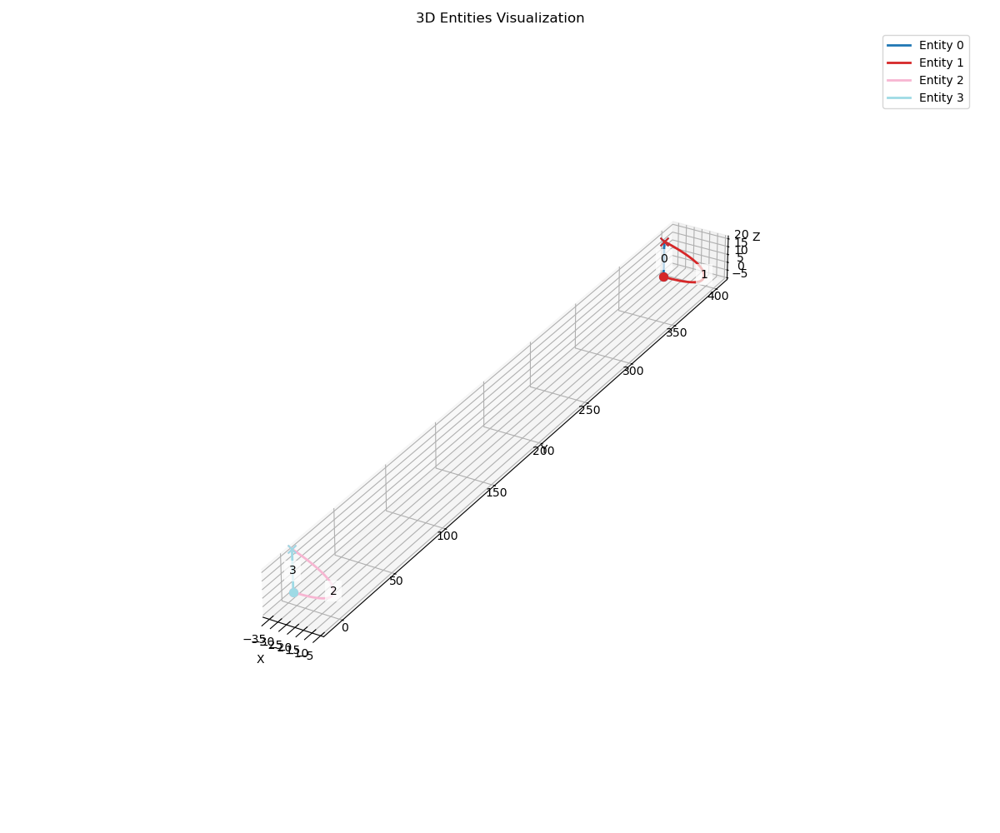

In [119]:
visualize_entities_3d(entities)

In [120]:
# left_plane_entities = [11, 10, 9, 2, 0, 1]
# right_plane_entities = [6, 7, 8, 5, 4, 3]

# # H TAIL
# left_plane_entities = [3, 2]
# right_plane_entities = [0, 1]

# V TAIL
left_plane_entities = [1, 0]
right_plane_entities = [2, 3]

left_entities = [entities[i] for i in left_plane_entities]
right_entities = [entities[i] for i in right_plane_entities]

all_points = []
for entity_tmp in left_entities + right_entities:
    all_points.extend(entity_tmp)

# Convert to numpy array for easier processing
all_points = np.array(all_points)

# Find y midpoint
y_offset = (np.max(all_points[:, 1]) + np.min(all_points[:, 1])) / 2

y_offset

np.float64(197.83576043977797)

In [121]:
entry_exit_config = {
    101: {
        "type": "entry",
        "distance": [10, 0],
    },
    102: {
        "type": "exit",
        "distance": [-10, 0],
    },
    103: {
        "type": "entry",
        "distance": [-10, 0],
    },
    104: {
        "type": "exit",
        "distance": [10, 0],
    },
    105: {
        "type": "entry",
        "distance": [0, -10],
    },
    106: {
        "type": "exit",
        "distance": [0, 10],
    },
}


# left_plane_entities = [11, 10, 9, 2, 0, 1]
# right_plane_entities = [6, 7, 8, 5, 4, 3]

# # TOP WING
# left_plane_entities = [101, 11, 10, 9, 102]
# right_plane_entities = [101, 6, 7, 8, 102]
# directions = [0,1,0,0,0] # 0 for auto, 1 for +x, 2 for -x

# # # BOTTOM WING
# left_plane_entities = [103, 2, 0, 1, 104]
# right_plane_entities = [103, 5, 4, 3, 104]
# directions = [0, -1, 0, 0, 0]  # 0 for auto, 1 for +x, -1 for -x

# HORIZONTAL TAIL
left_plane_entities = [105, 3, 2, 106]
right_plane_entities = [105, 0, 1, 106]
directions = [0, -2, 2, 0]  # 0 for auto, 1 for overall +x, -1 for overall -x, 2 for +z, -2 for -z

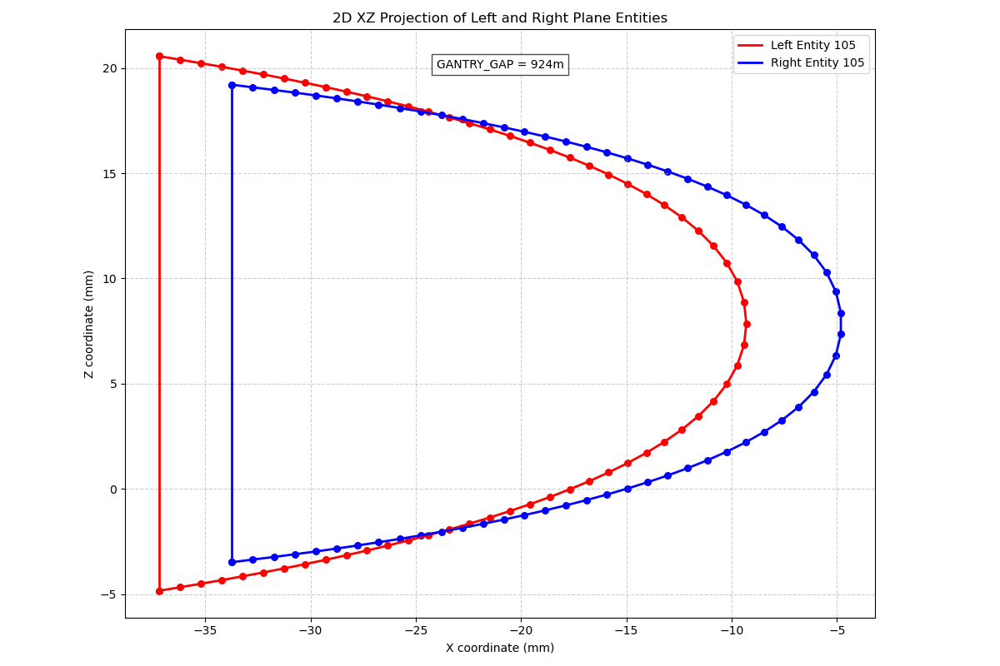

In [122]:
# Create figure and axis for 2D view
fig, ax = plt.subplots(figsize=(12, 8))

left_entities = []
for i, entity_id in enumerate(left_plane_entities):
    if entity_id < len(entities):
        left_entities.append(entities[entity_id])
        
right_entities = []
for i, entity_id in enumerate(right_plane_entities):
    if entity_id < len(entities):
        right_entities.append(entities[entity_id])

# Plot left plane entities
for i, entity in enumerate(left_entities):
    points = []
    # Extract X and Z coordinates for XZ projection
    x_points = [point[0] for point in entity]
    z_points = [point[2] for point in entity]

    # Plot this edge
    ax.plot(x_points, z_points, 'r-', linewidth=2, 
        label=f"Left Entity {left_plane_entities[i]}" if i == 0 else "")

    # Mark start and end points
    ax.scatter(x_points, z_points, color='red', marker='o', s=30)
    # ax.scatter(x_points[-1], z_points[-1], color='red', marker='x', s=30)

# Plot right plane entities
for i, entity in enumerate(right_entities):
    points = []
    # Extract X and Z coordinates for XZ projection
    x_points = [point[0] for point in entity]
    z_points = [point[2] for point in entity]

    # Plot this edge
    ax.plot(x_points, z_points, 'b-', linewidth=2,
            label=f"Right Entity {right_plane_entities[i]}" if i == 0 else "")

    # Mark start and end points
    ax.scatter(x_points, z_points, color='blue', marker='o', s=30)

# Add the gantry gap as a horizontal line or annotation
x_min, x_max = ax.get_xlim()
mid_x = (x_min + x_max) / 2
z_min, z_max = ax.get_zlim() if hasattr(ax, 'get_zlim') else ax.get_ylim()
mid_z = (z_min + z_max) / 2

# Add a note about the GANTRY_GAP
ax.text(mid_x, z_max - (z_max-z_min)*0.05, f"GANTRY_GAP = {GANTRY_GAP}m",
        ha='center', va='top', bbox=dict(facecolor='white', alpha=0.7))

# Set labels and title
ax.set_xlabel('X coordinate (mm)')
ax.set_ylabel('Z coordinate (mm)')
ax.set_title('2D XZ Projection of Left and Right Plane Entities')
ax.grid(True, linestyle='--', alpha=0.6)
ax.legend()

# Set equal aspect ratio for better visualization
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

In [123]:
def generate_hotcutting_paths(entities, left_entity_indices, right_entity_indices, gantry_gap, y_offset=0):
    """
    Generate hot wire cutting paths for the gantry based on left and right entities.
    
    Args:
        left_entities: List of entity point lists for the left side
        right_entities: List of entity point lists for the right side
        gantry_gap: Distance between gantry planes in meters
    
    Returns:
        List of gantry positions (XYAZ coordinates) for each cutting segment
    """
    if len(left_entity_indices) != len(right_entity_indices):
        raise ValueError(f"Entity count mismatch: Left {len(left_entity_indices)}, Right {len(right_entity_indices)}")

    cutting_paths = []
    last_end_positions = None

    for i, (left_entity_id, right_entity_id) in enumerate(zip(left_entity_indices, right_entity_indices)):
        if left_entity_id in entry_exit_config and right_entity_id in entry_exit_config:
            cutting_paths.append([-999,-999,-999, -999])
            continue

        # Skip empty entities
        left_entity = entities[left_entity_id]
        right_entity = entities[right_entity_id]
        if not left_entity or not right_entity:
            raise ValueError(f"Empty entity found: Left {left_entity_id}, Right {right_entity_id}")

        # Center y coordinates
        left_points = np.array(left_entity)
        right_points = np.array(right_entity)

        left_points[:, 1] -= y_offset
        right_points[:, 1] -= y_offset

        # Resample to ensure both entities have the same number of points
        resampled_left, resampled_right = resample_entities(left_points, right_points)

        # Determine cutting direction
        if directions[i] == 1:
            # increasing x
            if resampled_left[0][0] > resampled_left[-1][0]:
                resampled_left = resampled_left[::-1]
            if resampled_right[0][0] > resampled_right[-1][0]:
                resampled_right = resampled_right[::-1]
        elif directions[i] == -1:
            # decreasing x
            if resampled_left[0][0] < resampled_left[-1][0]:
                resampled_left = resampled_left[::-1]
            if resampled_right[0][0] < resampled_right[-1][0]:
                resampled_right = resampled_right[::-1]

        elif directions[i] == 2:
            # increasing z
            if resampled_left[0][2] > resampled_left[-1][2]:
                resampled_left = resampled_left[::-1]
            if resampled_right[0][2] > resampled_right[-1][2]:
                resampled_right = resampled_right[::-1]
                
        elif directions[i] == -2:
            # decreasing z
            if resampled_left[0][2] < resampled_left[-1][2]:
                resampled_left = resampled_left[::-1]
            if resampled_right[0][2] < resampled_right[-1][2]:
                resampled_right = resampled_right[::-1]

        elif directions[i] == 0:
            # choose direction that minimizes travel distance
            if last_end_positions is not None:
                last_left, last_right = last_end_positions[0], last_end_positions[1]
                # Calculate distances to both potential starting points
                start_dist = np.linalg.norm(last_left - resampled_left[0]) + np.linalg.norm(last_right - resampled_right[0])

                end_dist = np.linalg.norm(last_left - resampled_left[-1]) + np.linalg.norm(last_right - resampled_right[-1])

                if end_dist < start_dist:
                    # Reverse direction if the end is closer
                    resampled_left = resampled_left[::-1]
                    resampled_right = resampled_right[::-1]

        # Calculate gantry positions for this entity pair
        gantry_positions = calculate_gantry_positions(resampled_left, resampled_right, gantry_gap)

        cutting_paths.append(gantry_positions)

        last_end_positions = [resampled_left[-1], resampled_right[-1]]

    # add entry and exit points
    for i, (left_entity_id, right_entity_id) in enumerate(zip(left_entity_indices, right_entity_indices)):
        if left_entity_id in entry_exit_config and right_entity_id in entry_exit_config:
            assert left_entity_id == right_entity_id
            idx = left_entity_id
            if entry_exit_config[idx]["type"] == "entry":
                point = cutting_paths[i + 1][0]
                entity = np.array([(point[0] - entry_exit_config[idx]["distance"][0], point[1] - entry_exit_config[idx]["distance"][1], point[2] - entry_exit_config[idx]["distance"][0], point[3] - entry_exit_config[idx]["distance"][1]), point])
                cutting_paths[i] = entity
            elif entry_exit_config[idx]["type"] == "exit":
                point = cutting_paths[i - 1][-1]
                entity = np.array([point, (point[0] + entry_exit_config[idx]["distance"][0], point[1] + entry_exit_config[idx]["distance"][1], point[2] + entry_exit_config[idx]["distance"][0], point[3] + entry_exit_config[idx]["distance"][1])])
                cutting_paths[i] = entity

    return cutting_paths


def resample_entities(left_points, right_points):
    """Resample entities to have the same number of points"""
    # Choose the higher point count for better accuracy
    target_points = max(len(left_points), len(right_points))
    
    # Resample both entities to the target point count
    resampled_left = resample_curve(left_points, target_points)
    resampled_right = resample_curve(right_points, target_points)
    
    return resampled_left, resampled_right

def resample_curve(points, num_points):
    """Resample a curve to have a specific number of points"""
    # If we already have the correct number, return as is
    if len(points) == num_points:
        return points
    
    # Calculate cumulative distances along the curve
    dists = np.zeros(len(points))
    for i in range(1, len(points)):
        segment = points[i] - points[i-1]
        dists[i] = dists[i-1] + np.linalg.norm(segment)
    
    # Create new parameterization
    new_dists = np.linspace(0, dists[-1], num_points)
    
    # Interpolate points along the curve
    resampled_points = np.zeros((num_points, points.shape[1]))
    
    for i in range(points.shape[1]):  # For each dimension (x, y, z)
        resampled_points[:, i] = np.interp(new_dists, dists, points[:, i])
    
    return resampled_points

def calculate_gantry_positions(left_points, right_points, gantry_gap):
    """
    Calculate XY and AZ gantry positions where the wire intersects the gantry planes.
    
    Args:
        left_points: Points for the left side entity
        right_points: Points for the right side entity
        gantry_gap: Distance between gantry planes
    
    Returns:
        List of XYAZ coordinates for gantry positions
    """
    gantry_positions = []

    # Define the y-coordinates of the gantry planes
    left_plane_y = -gantry_gap / 2
    right_plane_y = gantry_gap / 2

    for left_pt, right_pt in zip(left_points, right_points):
        # Calculate the 3D line equation passing through both points
        # Line equation: P = P0 + t * (P1 - P0)
        direction = right_pt - left_pt

        # Check if the line is parallel to the gantry planes
        if abs(direction[1]) < 1e-6:  # Near-zero y component
            # If parallel, use the original points' x and z coordinates
            xy_pos = (left_pt[0], left_plane_y, left_pt[2])
            az_pos = (right_pt[0], right_plane_y, right_pt[2])
        else:
            # Calculate t for the left gantry plane intersection
            t_left = (left_plane_y - left_pt[1]) / direction[1]
            # Calculate the intersection point
            xy_pos = left_pt + t_left * direction

            # Calculate t for the right gantry plane intersection
            t_right = (right_plane_y - left_pt[1]) / direction[1]
            # Calculate the intersection point
            az_pos = left_pt + t_right * direction

        # Format as XYAZ coordinates (X, Y from XY gantry, A, Z from AZ gantry)
        xyaz = np.array([xy_pos[0], xy_pos[2], az_pos[0], az_pos[2]])
        gantry_positions.append(xyaz)

    gantry_positions = np.array(gantry_positions)
    return gantry_positions

def generate_cutting_paths_from_entities(left_entity_indices, right_entity_indices, entities):
    """Generate cutting paths from the specified entity indices"""

    # Generate cutting paths
    cutting_paths = generate_hotcutting_paths(entities, left_entity_indices, right_entity_indices, gantry_gap=GANTRY_GAP, y_offset=y_offset)

    return cutting_paths

In [124]:
def visualize_cutting_paths(cutting_paths, left_entities, right_entities, gantry_gap, y_offset=0, save=False):
    """Visualize the hot wire cutting paths in 3D"""
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection="3d")

    # Plot each cutting path
    for i, path in enumerate(cutting_paths):
        # Create arrays for gantry positions
        xy_x = [p[0] for p in path]
        xy_y = [-gantry_gap / 2 for _ in path]  # XY gantry is at y = -gantry_gap/2
        xy_z = [p[1] for p in path]

        az_x = [p[2] for p in path]
        az_y = [gantry_gap / 2 for _ in path]  # AZ gantry is at y = gantry_gap/2
        az_z = [p[3] for p in path]

        # Plot the gantry paths
        ax.plot(xy_x, xy_y, xy_z, "r-", linewidth=2, label=f"XY Path {i}" if i == 0 else "")
        ax.plot(az_x, az_y, az_z, "b-", linewidth=2, label=f"AZ Path {i}" if i == 0 else "")

        # Plot the hot wire connecting the gantries
        for j in range(len(path)):
            ax.plot([xy_x[j], az_x[j]], [xy_y[j], az_y[j]], [xy_z[j], az_z[j]], "g-", alpha=0.3)

        # Add markers for start and end points
        ax.scatter(xy_x[0], xy_y[0], xy_z[0], color="green", marker="o", s=50, label="Start" if i == 0 else "")
        ax.scatter(xy_x[-1], xy_y[-1], xy_z[-1], color="red", marker="x", s=50, label="End" if i == 0 else "")

    for i, entity in enumerate(left_entities):
        # Extract X and Z coordinates for XZ projection
        x_points = [point[0] for point in entity]
        y_points = [point[1] for point in entity] - y_offset
        z_points = [point[2] for point in entity]

        # Plot this edge
        ax.plot(x_points, y_points, z_points, "r-", linewidth=2, label=f"Left Entity" if i == 0 else "")

    # Plot right plane entities
    for i, entity in enumerate(right_entities):
        # Extract X and Z coordinates for XZ projection
        x_points = [point[0] for point in entity]
        y_points = [point[1] for point in entity] - y_offset
        z_points = [point[2] for point in entity]

        # Plot this edge
        ax.plot(x_points, y_points, z_points, "b-", linewidth=2, label=f"Right Entity" if i == 0 else "")

    # Set limits
    cutting_paths_flat = np.concatenate(cutting_paths, axis=0)
    x_min, x_max = np.min(cutting_paths_flat[:, [0, 2]]), np.max(cutting_paths_flat[:, [0, 2]])
    y_min, y_max = -gantry_gap / 2, gantry_gap / 2
    z_min, z_max = np.min(cutting_paths_flat[:, [1, 3]]), np.max(cutting_paths_flat[:, [1, 3]])
    
    # Calculate ranges and midpoints for each axis
    x_range = max(0.001, x_max - x_min)  # Avoid zero range
    y_range = max(0.001, y_max - y_min)
    z_range = max(0.001, z_max - z_min)
    
    x_mid = (x_max + x_min) / 2
    y_mid = (y_max + y_min) / 2
    z_mid = (z_max + z_min) / 2
    
    # Add a small margin (5%) to each axis range
    margin = 0.05
    x_margin = x_range * margin
    y_margin = y_range * margin
    z_margin = z_range * margin
    
    # Set axis limits with margins
    ax.set_xlim(x_min - x_margin, x_max + x_margin)
    ax.set_ylim(y_min - y_margin, y_max + y_margin)
    ax.set_zlim(z_min - z_margin, z_max + z_margin)
    
    # To make the visualization more balanced, find the largest range
    # and adjust the other axes to be more proportional
    max_range = max(x_range, y_range, z_range)
    
    # Use equal_aspect for a better 3D visualization
    # This makes the plot cube-like rather than stretched
    ax.set_box_aspect([
        x_range/max_range, 
        y_range/max_range, 
        z_range/max_range
    ])
    
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Z")
    ax.set_title("Hot Wire Cutting Paths")
    ax.legend()

    plt.tight_layout()
    plt.show()
    
    if save:
        fig.savefig("dual_gantry_cutting_paths_3d.png")

In [125]:
# Generate the cutting paths
cutting_paths = generate_cutting_paths_from_entities(left_plane_entities, right_plane_entities, entities)

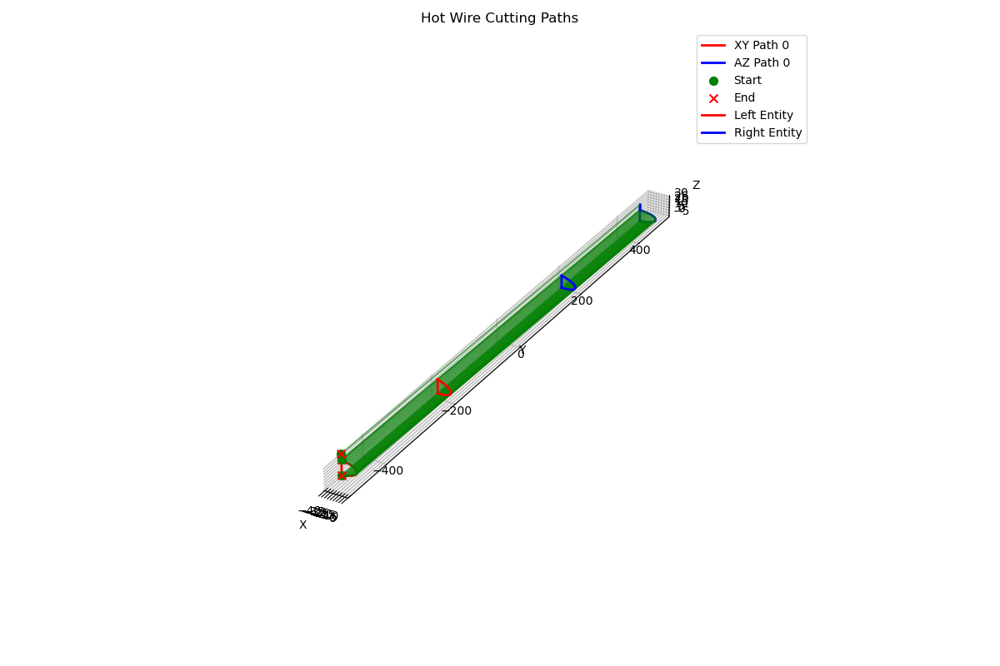

In [126]:
# Visualize the cutting paths
%matplotlib widget
visualize_cutting_paths(cutting_paths, left_entities, right_entities, gantry_gap=GANTRY_GAP, y_offset=y_offset, save=True)
# %matplotlib inline


In [127]:
def animate_dual_gantry_path(cutting_paths, tool_size=5.0, interval=30, speed=1.0):
    """
    Create an animation showing both XY and AZ gantry movements on the same 2D plot.
    Shows completed path segments and displays overall progress across all paths.
    Ensures consistent tool movement rate even on straight line segments.
    
    Args:
        cutting_paths: List of cutting paths, each containing XYAZ coordinates
        tool_size: Size of the circular markers representing the gantries
        interval: Milliseconds between frames
        speed: Speed multiplier for the animation (1.0 = normal speed)
        
    Returns:
        Animation object that can be displayed in the notebook
    """

    from IPython.display import HTML

    # Flatten all paths into a single array for calculating bounds
    all_points = np.vstack([path for path in cutting_paths if len(path) > 0])

    # Extract XY and AZ components
    xy_points = all_points[:, :2]  # X and Y (left gantry)
    az_points = all_points[:, 2:]  # A and Z (right gantry)

    # Set up the figure and axis
    fig, ax = plt.subplots(figsize=(10, 5))

    # Calculate limits to fit both paths with margin
    all_coords = np.vstack([xy_points, az_points])
    x_min, y_min = all_coords.min(axis=0) - tool_size*2
    x_max, y_max = all_coords.max(axis=0) + tool_size*2

    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_aspect('equal')

    # Plot the complete paths (light gray)
    for i, path in enumerate(cutting_paths):
        if len(path) > 0:
            ax.plot(path[:, 0], path[:, 1], 'lightgray', linewidth=1, alpha=0.7)  # XY path
            ax.plot(path[:, 2], path[:, 3], 'lightgray', linewidth=1, alpha=0.7)  # AZ path

    # Add a legend
    ax.plot([], [], 'b-', linewidth=2, label='XY Path')
    ax.plot([], [], 'g-', linewidth=2, label='AZ Path')
    ax.plot([], [], 'r-', linewidth=2, label='Hot Wire')
    ax.legend(loc='upper right')

    # Initialize the gantry markers
    if len(xy_points) > 0:
        xy_tool = patches.Circle((xy_points[0][0], xy_points[0][1]), tool_size, color='blue', alpha=0.7, zorder=10)
        az_tool = patches.Circle((az_points[0][0], az_points[0][1]), tool_size, color='green', alpha=0.7, zorder=10)
        ax.add_patch(xy_tool)
        ax.add_patch(az_tool)

        # Line connecting the two gantry positions (hot wire)
        wire_line, = ax.plot([xy_points[0][0], az_points[0][0]], 
                            [xy_points[0][1], az_points[0][1]], 
                            'r-', linewidth=2)

    # Lines for the traveled paths
    xy_traveled, = ax.plot([], [], 'b-', linewidth=2)
    az_traveled, = ax.plot([], [], 'g-', linewidth=2)

    # Progress text
    progress_text = ax.text(0.02, 0.98, "Overall Progress: 0%", 
                        transform=ax.transAxes, fontsize=12, verticalalignment='top')

    ax.set_title("Hot Wire Cutting Animation - XY and AZ Gantry Paths")
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.set_xlabel("X/A (mm)")
    ax.set_ylabel("Y/Z (mm)")

    # Process cutting paths to ensure consistent motion
    all_segments = []
    total_xy_length = 0
    total_az_length = 0

    # Process each path to create segments
    for path in cutting_paths:
        if len(path) < 2:
            continue

        # For paths with only two points (straight lines), ensure we calculate path distance correctly
        if len(path) == 2:
            start_point = path[0]
            end_point = path[1]

            # Calculate distances for the straight line
            xy_dist = np.linalg.norm(end_point[:2] - start_point[:2])
            az_dist = np.linalg.norm(end_point[2:] - start_point[2:])
            avg_dist = (xy_dist + az_dist) / 2

            # Add segment with start and end points
            all_segments.append((start_point, end_point, xy_dist, az_dist, avg_dist))

            # Accumulate total distance
            total_xy_length += xy_dist
            total_az_length += az_dist
        else:
            # For paths with more than two points, process segment by segment
            for i in range(1, len(path)):
                xy_dist = np.linalg.norm(path[i][:2] - path[i-1][:2])
                az_dist = np.linalg.norm(path[i][2:] - path[i-1][2:])
                avg_dist = (xy_dist + az_dist) / 2
                all_segments.append((path[i-1], path[i], xy_dist, az_dist, avg_dist))
                total_xy_length += xy_dist
                total_az_length += az_dist

    # Calculate total number of frames based on total path length
    avg_total_length = (total_xy_length + total_az_length) / 2
    total_frames = int(avg_total_length / speed) + 1  # Adjust multiplier for desired animation speed

    # Pre-compute positions for all frames for smoother animation
    frame_positions = []

    # Initialize tracking variables
    dist_so_far = 0
    overall_progress = 0

    if all_segments:
        # Add initial position with segment_idx = 0
        frame_positions.append((all_segments[0][0][:2], all_segments[0][0][2:], 0, 0))

        # Compute distance intervals for frames
        dist_per_frame = avg_total_length / total_frames

        current_segment_idx = 0
        current_segment = all_segments[0]
        segment_start_dist = 0

        for frame in range(1, total_frames + 1):
            target_dist = frame * dist_per_frame

            # Find the correct segment where this distance falls
            while dist_so_far + current_segment[4] < target_dist and current_segment_idx < len(all_segments) - 1:
                dist_so_far += current_segment[4]
                current_segment_idx += 1
                current_segment = all_segments[current_segment_idx]
                segment_start_dist = dist_so_far

            # Calculate position within current segment
            segment_progress = 0
            if current_segment[4] > 0:  # Avoid division by zero
                segment_progress = min(1.0, (target_dist - segment_start_dist) / current_segment[4])

            # Interpolate the position along this segment - this works for both straight and curved segments
            xy_pos = current_segment[0][:2] + segment_progress * (current_segment[1][:2] - current_segment[0][:2])
            az_pos = current_segment[0][2:] + segment_progress * (current_segment[1][2:] - current_segment[0][2:])

            # Calculate overall progress
            overall_progress = target_dist / avg_total_length

            # Add to position list
            frame_positions.append((xy_pos, az_pos, overall_progress, current_segment_idx))

    def init():
        if not frame_positions:
            return xy_traveled, az_traveled, progress_text

        xy_pos, az_pos, _, _ = frame_positions[0]
        xy_tool.center = (xy_pos[0], xy_pos[1])
        az_tool.center = (az_pos[0], az_pos[1])
        wire_line.set_data([xy_pos[0], az_pos[0]], [xy_pos[1], az_pos[1]])
        xy_traveled.set_data([], [])
        az_traveled.set_data([], [])
        progress_text.set_text("Overall Progress: 0%")
        return xy_tool, az_tool, wire_line, xy_traveled, az_traveled, progress_text

    def update(frame):
        if frame >= len(frame_positions):
            frame = len(frame_positions) - 1

        if not frame_positions:
            return xy_traveled, az_traveled, progress_text

        xy_pos, az_pos, progress, segment_idx = frame_positions[frame]

        # Update tool positions
        xy_tool.center = (xy_pos[0], xy_pos[1])
        az_tool.center = (az_pos[0], az_pos[1])

        # Update hot wire
        wire_line.set_data([xy_pos[0], az_pos[0]], [xy_pos[1], az_pos[1]])

        # Collect all points up to the current position for the traveled path
        xy_path_points = []
        az_path_points = []

        # Add all completed segments
        for i in range(segment_idx):
            xy_path_points.append(all_segments[i][0][:2])
            az_path_points.append(all_segments[i][0][2:])

        # Add the final segment endpoint if we're not on the last segment
        if segment_idx < len(all_segments):
            xy_path_points.append(all_segments[segment_idx][0][:2])
            az_path_points.append(all_segments[segment_idx][0][2:])

            # Add the current interpolated position
            xy_path_points.append(xy_pos)
            az_path_points.append(az_pos)

        # Update the traveled paths
        if xy_path_points:
            xy_traveled.set_data([p[0] for p in xy_path_points], [p[1] for p in xy_path_points])
            az_traveled.set_data([p[0] for p in az_path_points], [p[1] for p in az_path_points])

        # Update progress text with overall progress
        progress_pct = progress * 100
        progress_text.set_text(f"Overall Progress: {progress_pct:.1f}%")

        return xy_tool, az_tool, wire_line, xy_traveled, az_traveled, progress_text

    ani = FuncAnimation(fig, update, frames=total_frames,
                       init_func=init, blit=True, interval=interval)

    plt.close()  # Prevent display of static figure
    return ani


# Example usage
def create_dual_gantry_animation(cutting_paths, save_gif=False):
    """Wrapper function to create and display the dual gantry animation"""
    animation = animate_dual_gantry_path(cutting_paths, tool_size=2.0, interval=30, speed=2)
    if save_gif:
        animation.save('dual_gantry_animation_2d.gif', writer='pillow', fps=30)
    return HTML(animation.to_jshtml())

In [128]:
animation = create_dual_gantry_animation(cutting_paths, save_gif=True)
display(animation)

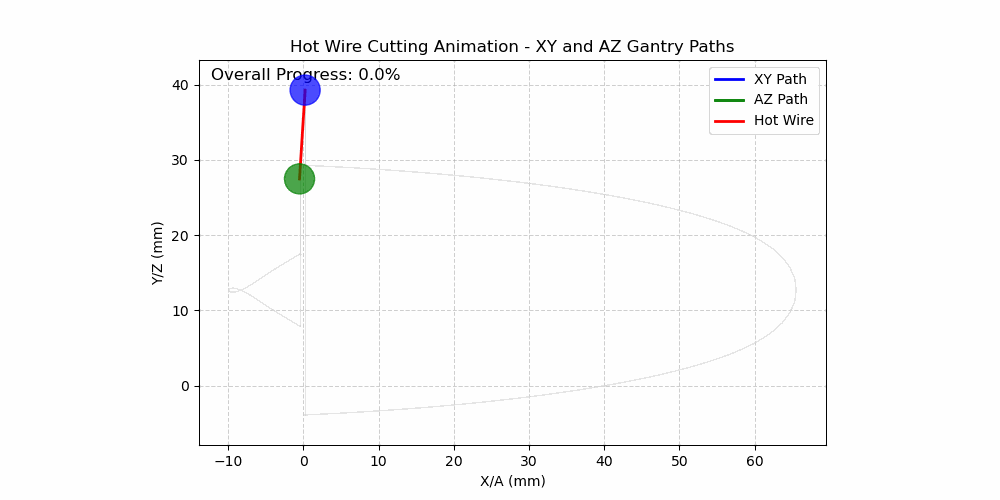

In [99]:
display(Image(data=open("dual_gantry_animation_2d.gif", "rb").read(), format="png"))

In [129]:
def animate_dual_gantry_path_3d(cutting_paths, left_entities, right_entities, gantry_gap=900,  
                              tool_size=5.0, speed=1, interval=30, y_offset=0):
    """
    Create a 3D animation showing both XY and AZ gantry movements with the connecting hot wire.
    Shows completed path segments, the profiles, and displays overall progress.
    
    Args:
        cutting_paths: List of cutting paths, each containing XYAZ coordinates
        left_entities: List of entity point lists for the left side
        right_entities: List of entity point lists for the right side
        gantry_gap: Distance between gantry planes
        tool_size: Size of the markers representing the gantries
        fps: Frames per second for the animation
        interval: Milliseconds between frames
        y_offset: Y-axis offset for centering entities
        
    Returns:
        Animation object that can be displayed in the notebook
    """

    # Set up the figure and 3D axis
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Define colors for different elements
    colors = {
        'left_entities': 'lightblue',
        'right_entities': 'lightgreen',
        'left_path': 'blue',
        'right_path': 'green',
        'hot_wire': 'red',
        'completed_left': 'blue',
        'completed_right': 'green'
    }

    # Calculate gantry positions
    left_plane_y = -gantry_gap/2
    right_plane_y = gantry_gap/2

    # Plot the left and right profiles/entities
    for entity in left_entities:
        points = np.array(entity)
        # Apply y-offset to center entities
        ax.plot(points[:, 0], points[:, 1] - y_offset, points[:, 2], 
                color=colors['left_entities'], alpha=0.5)

    for entity in right_entities:
        points = np.array(entity)
        # Apply y-offset to center entities
        ax.plot(points[:, 0], points[:, 1] - y_offset, points[:, 2], 
                color=colors['right_entities'], alpha=0.5)

    # Flatten all paths into a single array for calculating bounds
    all_points = np.vstack([path for path in cutting_paths if len(path) > 0])

    # Calculate overall limits from all paths and entities
    x_min, x_max = float('inf'), float('-inf')
    z_min, z_max = float('inf'), float('-inf')

    # Consider cutting paths for limits
    if len(all_points) > 0:
        x_min = min(x_min, np.min(all_points[:, [0, 2]]))
        x_max = max(x_max, np.max(all_points[:, [0, 2]]))
        z_min = min(z_min, np.min(all_points[:, [1, 3]]))
        z_max = max(z_max, np.max(all_points[:, [1, 3]]))

    # Consider entities for limits
    for entity in left_entities + right_entities:
        points = np.array(entity)
        x_min = min(x_min, np.min(points[:, 0]))
        x_max = max(x_max, np.max(points[:, 0]))
        z_min = min(z_min, np.min(points[:, 2]))
        z_max = max(z_max, np.max(points[:, 2]))

    # Add padding to limits
    padding = 0.1
    x_range = max(0.001, x_max - x_min)
    z_range = max(0.001, z_max - z_min)
    y_range = gantry_gap

    x_min -= padding * x_range
    x_max += padding * x_range
    z_min -= padding * z_range
    z_max += padding * z_range

    # Set limits with padding
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(left_plane_y - 0.2 * gantry_gap, right_plane_y + 0.2 * gantry_gap)
    ax.set_zlim(z_min, z_max)

    # Initialize the gantry markers and hot wire
    left_gantry = ax.scatter([], [], [], color=colors['left_path'], s=tool_size**2, 
                           marker='o', zorder=10)
    right_gantry = ax.scatter([], [], [], color=colors['right_path'], s=tool_size**2, 
                            marker='o', zorder=10)

    # Hot wire connecting the gantries
    hot_wire, = ax.plot([], [], [], color=colors['hot_wire'], linewidth=2, zorder=9)

    # Lines for the traveled paths
    left_traveled, = ax.plot([], [], [], color=colors['completed_left'], linewidth=2, zorder=8)
    right_traveled, = ax.plot([], [], [], color=colors['completed_right'], linewidth=2, zorder=8)

    # Progress text
    progress_text = ax.text2D(0.02, 0.98, "Overall Progress: 0%", 
                        transform=ax.transAxes, fontsize=12, verticalalignment='top')

    # Set labels and title
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title("Hot Wire Cutting Animation - 3D View")

    # Add a legend
    ax.plot([], [], [], color=colors['left_path'], linewidth=2, label='XY Path (Left Gantry)')
    ax.plot([], [], [], color=colors['right_path'], linewidth=2, label='AZ Path (Right Gantry)')
    ax.plot([], [], [], color=colors['hot_wire'], linewidth=2, label='Hot Wire')
    ax.legend(loc='upper right')

    # Calculate total path length and frames needed
    total_xy_length = 0
    total_az_length = 0
    all_segments = []

    for path in cutting_paths:
        if len(path) < 2:
            continue

        for i in range(1, len(path)):
            xy_dist = np.linalg.norm(path[i][:2] - path[i-1][:2])
            az_dist = np.linalg.norm(path[i][2:] - path[i-1][2:])
            avg_dist = (xy_dist + az_dist) / 2
            all_segments.append((path[i-1], path[i], xy_dist, az_dist, avg_dist))
            total_xy_length += xy_dist
            total_az_length += az_dist

    # Calculate total number of frames based on total path length
    avg_total_length = (total_xy_length + total_az_length) / 2
    total_frames = int(avg_total_length / speed) + 1  # Adjust multiplier for desired animation speed

    # Pre-compute positions for all frames
    frame_positions = []

    # Initialize tracking variables
    dist_so_far = 0
    overall_progress = 0

    if all_segments:
        # Add initial position with segment_idx = 0 to match tuple size
        frame_positions.append((all_segments[0][0][:2], all_segments[0][0][2:], 0, 0))

        # Compute distance intervals for frames
        dist_per_frame = avg_total_length / total_frames

        current_segment_idx = 0
        current_segment = all_segments[0]
        segment_start_dist = 0

        for frame in range(1, total_frames + 1):
            target_dist = frame * dist_per_frame

            # Find the correct segment where this distance falls
            while dist_so_far + current_segment[4] < target_dist and current_segment_idx < len(all_segments) - 1:
                dist_so_far += current_segment[4]
                current_segment_idx += 1
                current_segment = all_segments[current_segment_idx]
                segment_start_dist = dist_so_far

            # Calculate position within current segment
            segment_progress = 0
            if current_segment[4] > 0:  # Avoid division by zero
                segment_progress = min(1.0, (target_dist - segment_start_dist) / current_segment[4])

            # Interpolate the position along this segment
            xy_pos = current_segment[0][:2] + segment_progress * (current_segment[1][:2] - current_segment[0][:2])
            az_pos = current_segment[0][2:] + segment_progress * (current_segment[1][2:] - current_segment[0][2:])

            # Calculate overall progress
            overall_progress = target_dist / avg_total_length

            # Add to position list
            frame_positions.append((xy_pos, az_pos, overall_progress, current_segment_idx))

    def init():
        if not frame_positions:
            return left_gantry, right_gantry, hot_wire, left_traveled, right_traveled, progress_text

        xy_pos, az_pos, _, _ = frame_positions[0]

        # Update gantry positions
        left_gantry._offsets3d = ([xy_pos[0]], [left_plane_y], [xy_pos[1]])
        right_gantry._offsets3d = ([az_pos[0]], [right_plane_y], [az_pos[1]])

        # Hot wire position
        hot_wire.set_data([xy_pos[0], az_pos[0]], [left_plane_y, right_plane_y])
        hot_wire.set_3d_properties([xy_pos[1], az_pos[1]])

        left_traveled.set_data([], [])
        left_traveled.set_3d_properties([])
        right_traveled.set_data([], [])
        right_traveled.set_3d_properties([])

        progress_text.set_text("Overall Progress: 0%")

        return left_gantry, right_gantry, hot_wire, left_traveled, right_traveled, progress_text

    def update(frame):
        if frame >= len(frame_positions):
            frame = len(frame_positions) - 1

        if not frame_positions:
            return left_gantry, right_gantry, hot_wire, left_traveled, right_traveled, progress_text

        xy_pos, az_pos, progress, segment_idx = frame_positions[frame]

        # Update gantry positions (3D scatter)
        left_gantry._offsets3d = ([xy_pos[0]], [left_plane_y], [xy_pos[1]])
        right_gantry._offsets3d = ([az_pos[0]], [right_plane_y], [az_pos[1]])

        # Update hot wire position (3D line)
        hot_wire.set_data([xy_pos[0], az_pos[0]], [left_plane_y, right_plane_y])
        hot_wire.set_3d_properties([xy_pos[1], az_pos[1]])

        # Collect all points up to the current position for the traveled path
        left_x_points = []
        left_y_points = []
        left_z_points = []

        right_x_points = []
        right_y_points = []
        right_z_points = []

        # Add all completed segments
        for i in range(segment_idx):
            left_x_points.append(all_segments[i][0][0])
            left_y_points.append(left_plane_y)
            left_z_points.append(all_segments[i][0][1])

            right_x_points.append(all_segments[i][0][2])
            right_y_points.append(right_plane_y)
            right_z_points.append(all_segments[i][0][3])

        # Add the starting point of the current segment
        if segment_idx < len(all_segments):
            left_x_points.append(all_segments[segment_idx][0][0])
            left_y_points.append(left_plane_y)
            left_z_points.append(all_segments[segment_idx][0][1])

            right_x_points.append(all_segments[segment_idx][0][2])
            right_y_points.append(right_plane_y)
            right_z_points.append(all_segments[segment_idx][0][3])

            # Add the current interpolated position
            left_x_points.append(xy_pos[0])
            left_y_points.append(left_plane_y)
            left_z_points.append(xy_pos[1])

            right_x_points.append(az_pos[0])
            right_y_points.append(right_plane_y)
            right_z_points.append(az_pos[1])

        # Update the traveled paths
        if left_x_points:
            left_traveled.set_data(left_x_points, left_y_points)
            left_traveled.set_3d_properties(left_z_points)

            right_traveled.set_data(right_x_points, right_y_points)
            right_traveled.set_3d_properties(right_z_points)

        # Update progress text with overall progress
        progress_pct = progress * 100
        progress_text.set_text(f"Overall Progress: {progress_pct:.1f}%")

        return left_gantry, right_gantry, hot_wire, left_traveled, right_traveled, progress_text

    # Create the animation
    ani = FuncAnimation(fig, update, frames=total_frames,
                       init_func=init, blit=True, interval=interval)

    # Set a good default view angle
    ax.view_init(elev=20, azim=-35)

    plt.close()  # Prevent display of static figure
    return ani


def create_dual_gantry_animation_3d(cutting_paths, left_plane_entities, right_plane_entities, entities, y_offset=0, save_gif=False):
    """Wrapper function to create and display the 3D dual gantry animation"""
    # Extract the entities
    left_entities = []
    for i, entity_id in enumerate(left_plane_entities):
        if entity_id < len(entities):
            left_entities.append(entities[entity_id])

    right_entities = []
    for i, entity_id in enumerate(right_plane_entities):
        if entity_id < len(entities):
            right_entities.append(entities[entity_id])

    # Create the animation
    animation = animate_dual_gantry_path_3d(
        cutting_paths, left_entities, right_entities, 
        gantry_gap=GANTRY_GAP, tool_size=5.0, speed=3, interval=50, y_offset=y_offset
    )

    if save_gif:
        animation.save('dual_gantry_animation_3d.gif', writer='pillow', fps=30)

    return HTML(animation.to_jshtml())

In [130]:
# Use the new 3D animation function
animation_3d = create_dual_gantry_animation_3d(cutting_paths, left_plane_entities, right_plane_entities, entities, y_offset=y_offset, save_gif=True)
display(animation_3d)

In [ ]:
display(Image(data=open("dual_gantry_animation_3d.gif", "rb").read(), format="png"))

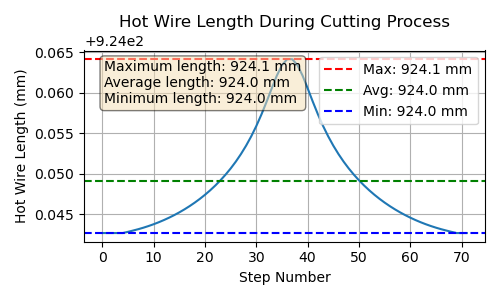

In [131]:
def calculate_hotwire_lengths(cutting_paths):
    """Calculate the wire length at each step of the cutting path."""
    lengths = []
    
    for path in cutting_paths:
        for step in path:
            # Calculate the distance between the left and right points
            left_point = np.array([step[0], -GANTRY_GAP/2, step[1]])
            right_point = np.array([step[2], GANTRY_GAP/2, step[3]])
            
            # Calculate Euclidean distance (wire length)
            wire_length = np.linalg.norm(right_point - left_point)
            lengths.append(wire_length)
    
    return np.array(lengths)

# Calculate all wire lengths
wire_lengths = calculate_hotwire_lengths(cutting_paths)

# Find maximum and average length
max_length = np.max(wire_lengths)
avg_length = np.mean(wire_lengths)
min_length = np.min(wire_lengths)

# Create a plot showing the wire length throughout the cutting process
plt.figure(figsize=(5, 3))
plt.plot(wire_lengths)
plt.axhline(y=max_length, color='r', linestyle='--', label=f'Max: {max_length:.1f} mm')
plt.axhline(y=avg_length, color='g', linestyle='--', label=f'Avg: {avg_length:.1f} mm')
plt.axhline(y=min_length, color='b', linestyle='--', label=f'Min: {min_length:.1f} mm')

# Add labels and title
plt.xlabel('Step Number')
plt.ylabel('Hot Wire Length (mm)')
plt.title('Hot Wire Length During Cutting Process')
plt.grid(True)
plt.legend()

# Show statistics in text box
textstr = f'Maximum length: {max_length:.1f} mm\nAverage length: {avg_length:.1f} mm\nMinimum length: {min_length:.1f} mm'
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, fontsize=10,
         verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()

In [132]:
def generate_gcode(cutting_paths, feed_rate=200.0, wire_current=1000):
    """Generate G-code from a list of points."""
    cutting_paths_flat = np.concatenate(cutting_paths, axis=0)

    gcode = []

    # Header
    gcode.append("; Generated G-code for 4-axis hot wire cutter")
    gcode.append("; 2D profile cutting mode - left and right sides move together")
    gcode.append("")
    gcode.append("G17 ; XY plane")
    gcode.append("G21 ; Set units to millimeters")
    gcode.append("G90 ; Use absolute positioning")
    gcode.append("G40 ; Cutter compensation off")
    gcode.append("G49 ; Tool length offset compensation off")
    gcode.append("G64 ; Path Control Mode - Continuous mode")
    gcode.append("G94 ; Set feed rate")
    gcode.append(f"G{feed_rate} ; mm/min")
    gcode.append(f"M3 S{wire_current} ; Set wire current")
    gcode.append("G4 P2 ; Wait 2 seconds for wire to heat up")
    gcode.append("")

    # Move to the first point (rapid positioning)
    first_point = cutting_paths_flat[0]
    gcode.append(f"G0 X{first_point[0]:.3f} Y{first_point[1]:.3f} A{first_point[2]:.3f} Z{first_point[3]:.3f}; Rapid move to start position")

    # Add points for cutting (linear interpolation)
    for point in cutting_paths_flat[1:]:
        gcode.append(f"G1 X{point[0]:.3f} Y{point[1]:.3f} A{point[2]:.3f} Z{point[3]:.3f}")

    # Footer
    gcode.append("")
    gcode.append("M5 ; Turn off wire heater")
    gcode.append("M2 ; End program")

    return gcode

In [133]:
def write_gcode_file(gcode, output_file):
    """Write G-code to file."""
    try:
        with open(output_file, "w") as f:
            for line in gcode:
                f.write(line + "\n")
        print(f"G-code successfully written to: {output_file}")
        return True
    except Exception as e:
        print(f"Error writing G-code file: {e}")
        return False

In [ ]:
gcode = generate_gcode(cutting_paths, feed_rate=120)

# Write G-code to output file
# write_gcode_file(gcode, 'x1_wing_top.ngc')
# write_gcode_file(gcode, 'x1_wing_bottom.ngc')
# write_gcode_file(gcode, "leading_edge.ngc")
# write_gcode_file(gcode, "htail_leading_edge.ngc")
write_gcode_file(gcode, "vtail_leading_edge.ngc")

G-code successfully written to: vtail_leading_edge.ngc


True